# PASTIS Dataset

## Intro

PASTIS (Panoptic Agricultural Satellite Time Series)[(Garnot et al. 2021)](https://arxiv.org/abs/2112.07558v1) is a comprehensive multi-temporal satellite dataset for agricultural monitoring and crop type classification. The dataset combines Sentinel-1 SAR and Sentinel-2 optical time series with crop type annotations, enabling both semantic and instance segmentation of agricultural parcels. We use the PASTIS-R dataset version.

## Dataset Characteristics

- **Modalities**: 
  - Sentinel-1 SAR imagery (ascending and descending orbits)
  - Sentinel-2 optical imagery (multi-spectral)
- **Spatial Resolution**: 
  - S1: 10m ground sample distance
  - S2: 10m ground sample distance
- **Temporal Resolution**: Multi-temporal time series throughout growing seasons
- **Spectral Bands**: 
  - S2: 10 bands (B02, B03, B04, B05, B06, B07, B08, B8A, B11, B12)
  - S1 Ascending: VV, VH polarizations + VV/VH ratio (3 bands)
  - S1 Descending: VV, VH polarizations + VV/VH ratio (3 bands)
- **Image Dimensions**: 128x128 pixels per patch (1.28km x 1.28km)
- **Labels**: Agricultural crop type classification and instance segmentation
  - 18 crop classes + background class
  - Both semantic segmentation and instance segmentation masks
  - Parcel-level annotations
- **Geographic Distribution**: France (comprehensive agricultural coverage)
- **Temporal Coverage**: Full growing seasons (2018-2019)
- **Task**: Crop type classification and agricultural parcel segmentation

## Dataset Setup and Initialization

In [4]:
from pathlib import Path
from geobench_v2.datamodules import GeoBenchPASTISDataModule

# Setup paths
PROJECT_ROOT = Path("../../")

# Initialize datamodule
datamodule = GeoBenchPASTISDataModule(
    img_size=128,
    batch_size=8,
    num_workers=4,
    num_time_steps=4,
    root=PROJECT_ROOT / "data" / "pastis",
    download=True
)

datamodule.setup("fit")
datamodule.setup("test")

print("PASTIS datamodule initialized successfully!")
print(f"Training samples: {len(datamodule.train_dataset)}")
print(f"Validation samples: {len(datamodule.val_dataset)}")
print(f"Test samples: {len(datamodule.test_dataset)}")

Initializing normalizer from class: ZScoreNormalizer
Initializing normalizer from class: ZScoreNormalizer
Initializing normalizer from class: ZScoreNormalizer
PASTIS datamodule initialized successfully!
Training samples: 1200
Validation samples: 482
Test samples: 496


## Geographic Distribution Visualization

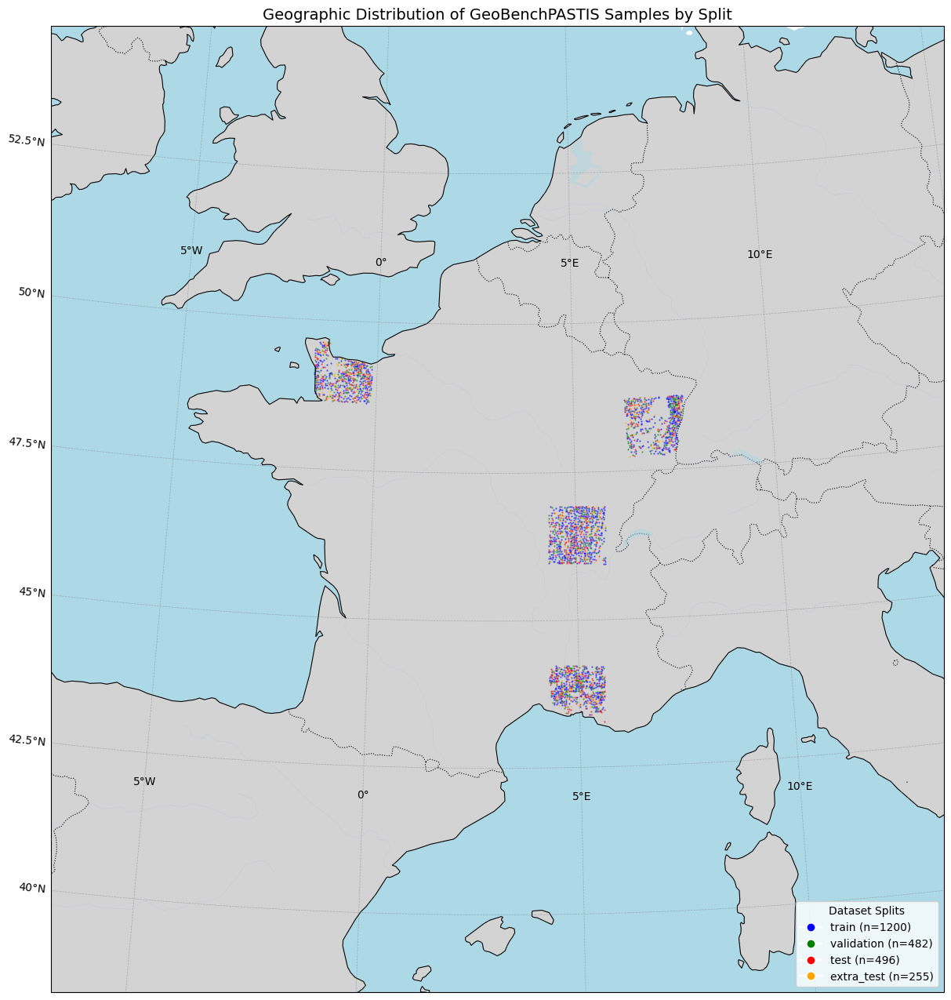

In [5]:
geo_fig = datamodule.visualize_geospatial_distribution()

## Sample Data Visualization

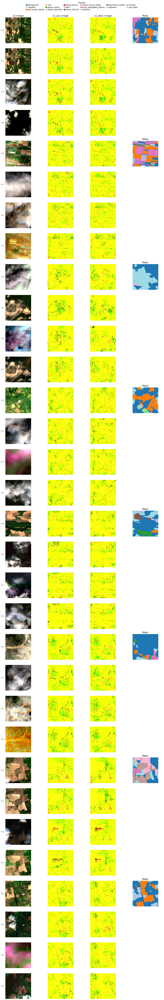

In [6]:
fig, batch = datamodule.visualize_batch()

## GeoBenchV2 Processing Pipeline

### Preprocessing Steps

1. **Split Generation**:
   - We use the prescriped splits from the PASTIS-R dataset

2. **Dataset Subsampling**:
    - The final version consists of
        - 1,200 training time-series samples
        - 482 validation time-series samples
        - 496 test time-series samples
        - 255 additional test time-series samples that come from the original training split


## References

1. Garnot, V.S.F., Landrieu, L. and Chehata, N., 2022. Multi-modal temporal attention models for crop mapping from satellite time series. ISPRS Journal of Photogrammetry and Remote Sensing, 187, pp.294-305.